In [3]:
import os
import random
import time
import json
import warnings 
warnings.filterwarnings('ignore')

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import cv2
from dataset import *
import numpy as np
import pandas as pd

from utils import *
from cutmix.cutmix import CutMix

# 시각화를 위한 라이브러리
import matplotlib.pyplot as plt

# 시각화를 위한 라이브러리import matplotlib.pyplot as plt
import seaborn as sns; sns.set()

plt.rcParams['axes.grid'] = False

print('pytorch version: {}'.format(torch.__version__))
print('GPU 사용 가능 여부: {}'.format(torch.cuda.is_available()))

print(torch.cuda.get_device_name(0))
print(torch.cuda.device_count())

device = "cuda" if torch.cuda.is_available() else "cpu"   # GPU 사용 가능 여부에 따라 device 정보 저장

pytorch version: 1.4.0
GPU 사용 가능 여부: True
Tesla P40
1


## 학습 EDA 

In [15]:
%matplotlib inline

def get_info(mode):
    dataset_path = '/opt/ml/input/data'
    anns_file_path = dataset_path + '/' + mode+'.json'

    # Read annotations
    with open(anns_file_path, 'r') as f:
        dataset = json.loads(f.read())

    categories = dataset['categories']
    anns = dataset['annotations']
    imgs = dataset['images']
    nr_cats = len(categories)
    nr_annotations = len(anns)
    nr_images = len(imgs)

    # Load categories and super categories
    cat_names = []
    super_cat_names = []
    super_cat_ids = {}
    super_cat_last_name = ''
    nr_super_cats = 0
    for cat_it in categories:
        cat_names.append(cat_it['name'])
        super_cat_name = cat_it['supercategory']
        # Adding new supercat
        if super_cat_name != super_cat_last_name:
            super_cat_names.append(super_cat_name)
            super_cat_ids[super_cat_name] = nr_super_cats
            super_cat_last_name = super_cat_name
            nr_super_cats += 1
    return anns, nr_super_cats, nr_cats, nr_annotations, nr_images



In [16]:
anns, nr_super_cats, nr_cats, nr_annotations, nr_images= get_info("train")
print('Number of super categories:', nr_super_cats)
print('Number of categories:', nr_cats)
print('Number of annotations:', nr_annotations)
print('Number of images:', nr_images)

Number of super categories: 11
Number of categories: 11
Number of annotations: 21116
Number of images: 2617


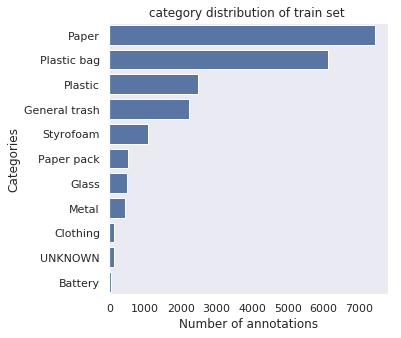

In [17]:
cat_histogram = np.zeros(nr_cats,dtype=int)
for ann in anns:
    cat_histogram[ann['category_id']] += 1

# Initialize the matplotlib figure
f, ax = plt.subplots(figsize=(5,5))

# Convert to DataFrame
df = pd.DataFrame({'Categories': cat_names, 'Number of annotations': cat_histogram})
df = df.sort_values('Number of annotations', 0, False)

# Plot the histogram
plt.title("category distribution of train set ")
plot_1 = sns.barplot(x="Number of annotations", y="Categories", data=df, label="Total", color="b")

In [21]:
anns, nr_super_cats, nr_cats, nr_annotations, nr_images= get_info("val")
print('Number of super categories:', nr_super_cats)
print('Number of categories:', nr_cats)
print('Number of annotations:', nr_annotations)
print('Number of images:', nr_images)

Number of super categories: 11
Number of categories: 11
Number of annotations: 5284
Number of images: 655


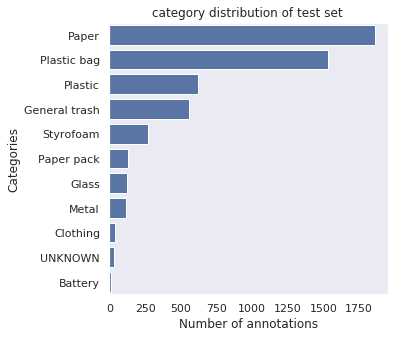

In [22]:
cat_histogram = np.zeros(nr_cats,dtype=int)
for ann in anns:
    cat_histogram[ann['category_id']] += 1

# Initialize the matplotlib figure
f, ax = plt.subplots(figsize=(5,5))

# Convert to DataFrame
df = pd.DataFrame({'Categories': cat_names, 'Number of annotations': cat_histogram})
df = df.sort_values('Number of annotations', 0, False)

# Plot the histogram
plt.title("category distribution of test set ")
plot_1 = sns.barplot(x="Number of annotations", y="Categories", data=df, label="Total", color="b")

In [25]:
anns, nr_super_cats, nr_cats, nr_annotations, nr_images= get_info("train_all")
print('Number of super categories:', nr_super_cats)
print('Number of categories:', nr_cats)
print('Number of annotations:', nr_annotations)
print('Number of images:', nr_images)

Number of super categories: 11
Number of categories: 11
Number of annotations: 26400
Number of images: 3272


## Argument Image EDA

In [360]:
from utils import *
import albumentations as A
from albumentations.pytorch import ToTensorV2

seed_everything(21)


def show_arg_img(train_transform, seed=1):
    train_path = dataset_path + '/train.json'
    val_path = dataset_path + '/val.json'
    test_path = dataset_path + '/test.json'
    origin_transform = A.Compose([
                            A.Resize(256,256),
                            ToTensorV2()
                            ])

    train_dataset = CustomDataLoader(data_dir=train_path, mode='val', transform=train_transform)
    origin_dataset = CustomDataLoader(data_dir=train_path, mode='val', transform=origin_transform)

    fig, axes = plt.subplots(nrows=2, ncols=6, figsize=(20, 8))
    row, col = 0,0

    for i in range(4):
        idx = i +10 * seed 
        temp_images, temp_masks, image_infos = train_dataset[idx]
        origin_images, _ , _ = origin_dataset[idx]

        row = i//2

        if i%2 ==0:
            cols=0
        else:
            cols =3
        imgs = [origin_images.permute([1,2,0]),temp_images.permute([1,2,0]),temp_masks ]
        title = ["Original Data","Argumantation Data", "Mask Data"]
        cnt =0
        for col in range(cols,cols+3):
            axes[row][col].imshow(imgs[cnt])
            axes[row][col].grid(False)
            axes[row][col].set_title(title[cnt], fontsize = 10)
            cnt +=1

    plt.show()


### 밝기(Brightness), 대비(Contrast) 조절 

데이터를 보면 실내, 실외, 밤, 낮에 찍은 사진이 있다. 이는 어둡고 밝은 사진이 있다. 데이터의 밝기와 대비를 랜덤으로 조절하여, 밤과 낮의 데이터로 증강 시키면 학습의 성능에 좋은 영향을 줄 것으로 기대된다.
albumentations의 RandomBrightnessContrast 값을 그대로 사용하면 , 어두운 사진이 너무 어둡게 변형되는 것을 알 수 있다. 
이를 해결하기 개선 위해 brightness_limit=0.2 를 brightness_limit=0.15 변경하였다.
 

loading annotations into memory...
Done (t=5.21s)
creating index...
index created!
loading annotations into memory...
Done (t=5.44s)
creating index...
index created!


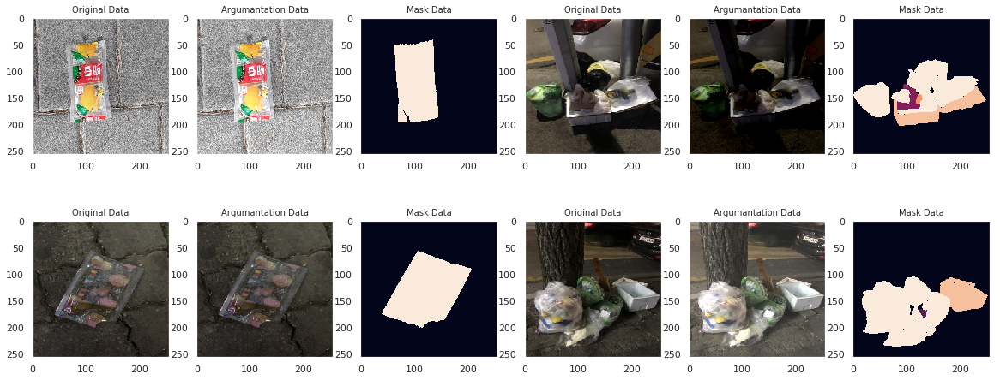

In [221]:
train_transform = A.Compose([
                            A.Resize(256,256),
                            A.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, always_apply=True, p=1),
                            ToTensorV2()
                            ])
show_arg_img(train_transform)

loading annotations into memory...
Done (t=5.52s)
creating index...
index created!
loading annotations into memory...
Done (t=5.59s)
creating index...
index created!


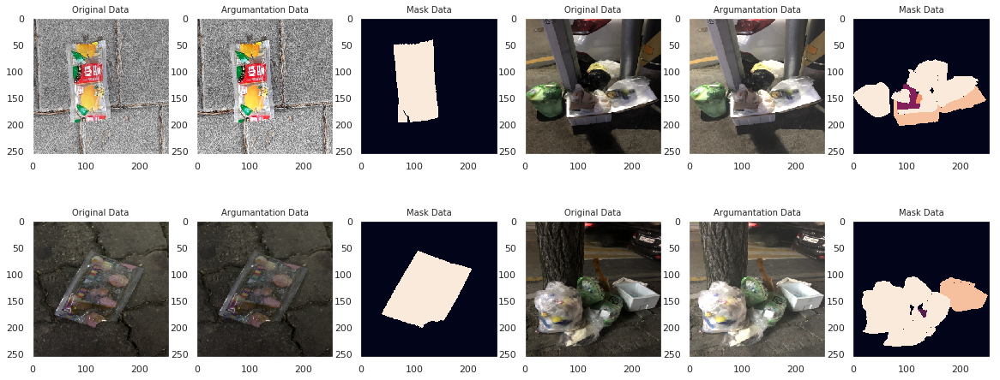

In [270]:
train_transform = A.Compose([
                            A.Resize(256,256),
                            A.RandomBrightnessContrast(brightness_limit=0.15, contrast_limit=0.2, always_apply=True, p=1),
                            ToTensorV2()
                            ])

show_arg_img(train_transform)

## 회전

사진이 객체들은 대체로 위로 보고 있다. 그러나 일부 물체들은 기울어져 있거나 눕혀져 있다.   Rotate 를 -45 ~ 45 도 정도 주면서 데이터를 증강시키는 것도 좋은 방법이다.

loading annotations into memory...
Done (t=5.34s)
creating index...
index created!
loading annotations into memory...
Done (t=5.46s)
creating index...
index created!


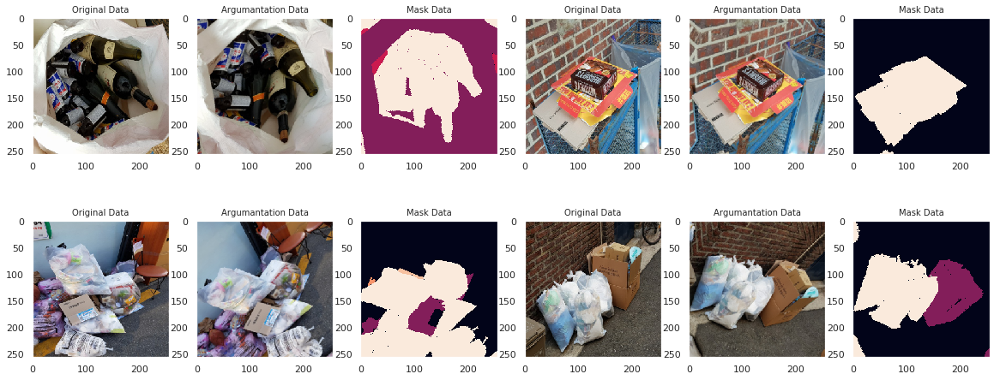

In [271]:
from importlib import import_module
from dataset import *
#train_transform = getattr(import_module("dataset"), "vflip") 
size = 256


def data_resize():
  return A.Compose([
    A.Resize(size, size),                           
    A.Rotate(limit=65, always_apply=True, p=1),
    ToTensorV2()
    ])


show_arg_img(data_resize(),100)

## 대칭

사진이 객체들은 대체로 위로 보고 있다. 상하 대칭은 물체가 뒤집히기 때문에 오히려 학습 성능이 떨어질 것 같다. 이번에는 좌우 대칭만 적용할 예정이다.

loading annotations into memory...
Done (t=5.64s)
creating index...
index created!
loading annotations into memory...
Done (t=5.37s)
creating index...
index created!


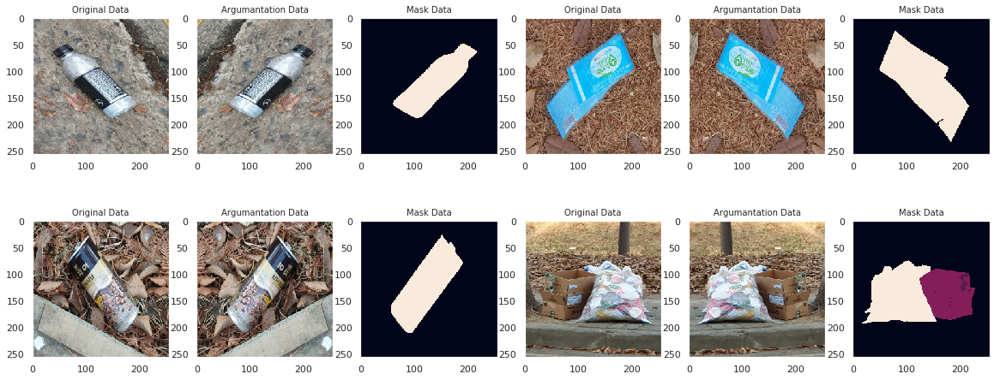

In [272]:
from importlib import import_module
from dataset import *
#train_transform = getattr(import_module("dataset"), "vflip") 
size = 256


def data_hflip():
  return A.Compose([
    A.Resize(size, size),                           
    A.HorizontalFlip(always_apply=True, p=1),
    ToTensorV2()
    ])


show_arg_img(data_hflip(),50)

## GridMask

데이터의 일부 영역을 지워주면, 데이터 학습시 오버피팅을 방지하게 되어 일반화 성능을 높여준다. Cutout를 사용하면 이미지의 중요한 특징도 같이 지워진다. 이번 실험에서는 작은 영역을 지워주는 GridMask 를 적용할 예정이다.


loading annotations into memory...
Done (t=3.82s)
creating index...
index created!
loading annotations into memory...
Done (t=3.59s)
creating index...
index created!


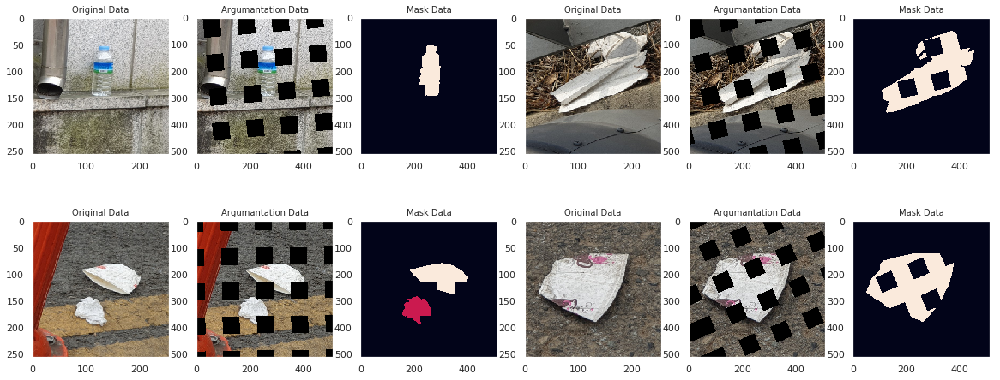

In [273]:
from albumentations.core.transforms_interface import DualTransform
from albumentations.augmentations import functional as F

#https://www.kaggle.com/haqishen/gridmask
class GridMask(DualTransform):
    """GridMask aug#mentation for image classification and object detection.
    
    Author: Qishen Ha
    Email: haqishen@gmail.com
    2020/01/29

    Args:
        num_grid (int): number of grid in a row or column.
        fill_value (int, float, lisf of int, list of float): value for dropped pixels.
        rotate ((int, int) or int): range from which a random angle is picked. If rotate is a single int
            an angle is picked from (-rotate, rotate). Default: (-90, 90)
        mode (int):
            0 - cropout a quarter of the square of each grid (left top)
            1 - reserve a quarter of the square of each grid (left top)
            2 - cropout 2 quarter of the square of each grid (left top & right bottom)

    Targets:
        image, mask

    Image types:
        uint8, float32

    Reference:
    |  https://arxiv.org/abs/2001.04086
    |  https://github.com/akuxcw/GridMask
    """

    def __init__(self, num_grid=3, fill_value=0, rotate=0, mode=0, always_apply=False, p=0.5):
        super(GridMask, self).__init__(always_apply, p)
        if isinstance(num_grid, int):
            num_grid = (num_grid, num_grid)
        if isinstance(rotate, int):
            rotate = (-rotate, rotate)
        self.num_grid = num_grid
        self.fill_value = fill_value
        self.rotate = rotate
        self.mode = mode
        self.masks = None
        self.rand_h_max = []
        self.rand_w_max = []

    def init_masks(self, height, width):
        if self.masks is None:
            self.masks = []
            n_masks = self.num_grid[1] - self.num_grid[0] + 1
            for n, n_g in enumerate(range(self.num_grid[0], self.num_grid[1] + 1, 1)):
                grid_h = height / n_g
                grid_w = width / n_g
                this_mask = np.ones((int((n_g + 1) * grid_h), int((n_g + 1) * grid_w))).astype(np.uint8)
                for i in range(n_g + 1):
                    for j in range(n_g + 1):
                        this_mask[
                             int(i * grid_h) : int(i * grid_h + grid_h / 2),
                             int(j * grid_w) : int(j * grid_w + grid_w / 2)
                        ] = self.fill_value
                        if self.mode == 2:
                            this_mask[
                                 int(i * grid_h + grid_h / 2) : int(i * grid_h + grid_h),
                                 int(j * grid_w + grid_w / 2) : int(j * grid_w + grid_w)
                            ] = self.fill_value
                
                if self.mode == 1:
                    this_mask = 1 - this_mask

                self.masks.append(this_mask)
                self.rand_h_max.append(grid_h)
                self.rand_w_max.append(grid_w)

    def apply(self, image, mask, rand_h, rand_w, angle, **params):
        h, w = image.shape[:2]
        mask = F.rotate(mask, angle) if self.rotate[1] > 0 else mask
        mask = mask[:,:,np.newaxis] if image.ndim == 3 else mask
        image *= mask[rand_h:rand_h+h, rand_w:rand_w+w].astype(image.dtype)
        return image

    def get_params_dependent_on_targets(self, params):
        img = params['image']
        height, width = img.shape[:2]
        self.init_masks(height, width)

        mid = np.random.randint(len(self.masks))
        mask = self.masks[mid]
        rand_h = np.random.randint(self.rand_h_max[mid])
        rand_w = np.random.randint(self.rand_w_max[mid])
        angle = np.random.randint(self.rotate[0], self.rotate[1]) if self.rotate[1] > 0 else 0

        return {'mask': mask, 'rand_h': rand_h, 'rand_w': rand_w, 'angle': angle}

    @property
    def targets_as_params(self):
        return ['image']

    def get_transform_init_args_names(self):
        return ('num_grid', 'fill_value', 'rotate', 'mode')

def data_gridmask():
  return A.Compose([                      
    GridMask(num_grid=(4), p=1, rotate=25),
    ToTensorV2()
    ])


show_arg_img(data_gridmask(),30)

## 눈 

데이터를 보면, 눈이 배경인 사진이 꽤 된다. 눈에 대한 기능을 넣어야 할까 ??
그러나 테스트 데이터에는 없다? RandomSnow 적용할 것인가? 말 것인가?

loading annotations into memory...
Done (t=5.04s)
creating index...
index created!
loading annotations into memory...
Done (t=5.62s)
creating index...
index created!


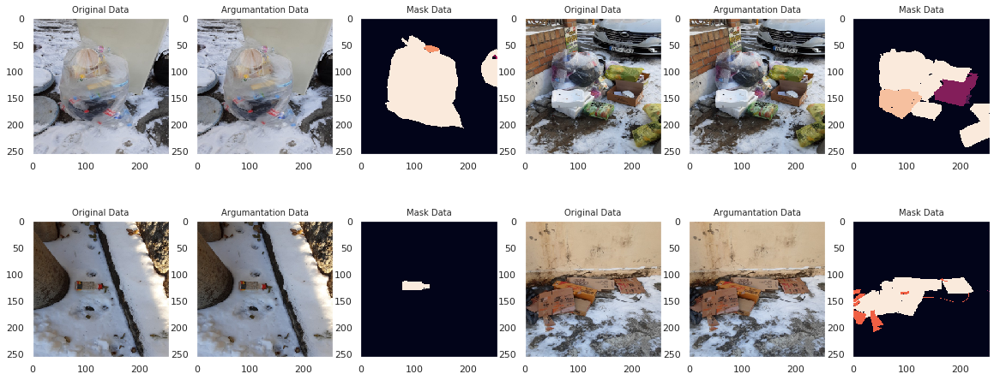

In [259]:
size = 256


def basic():
  return A.Compose([
    A.Resize(size, size),                           
    ToTensorV2()
    ])


show_arg_img(basic(),20)

### ShiftScaleRotate
캐글 상위팀은 ShiftScaleRotate 적용해봤다 모냐 이건?
Rotate 보다 괜찮네, 최대 회전 각도도 45도로 적당해 역시 캐글 상위팀이 쓸만하네

loading annotations into memory...
Done (t=5.06s)
creating index...
index created!
loading annotations into memory...
Done (t=5.26s)
creating index...
index created!


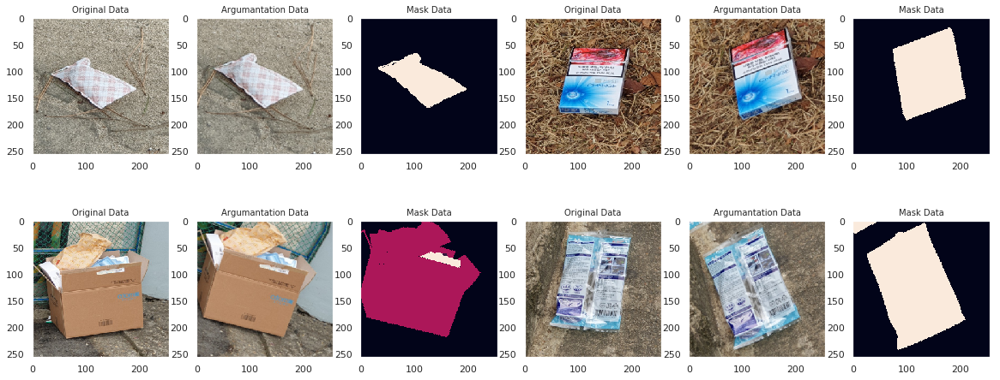

In [266]:
size = 256


def basic():
  return A.Compose([
    A.Resize(size, size),
    A.ShiftScaleRotate(always_apply=True, p=1),
    ToTensorV2()
    ])


show_arg_img(basic(),25)

loading annotations into memory...
Done (t=5.20s)
creating index...
index created!
loading annotations into memory...
Done (t=5.38s)
creating index...
index created!


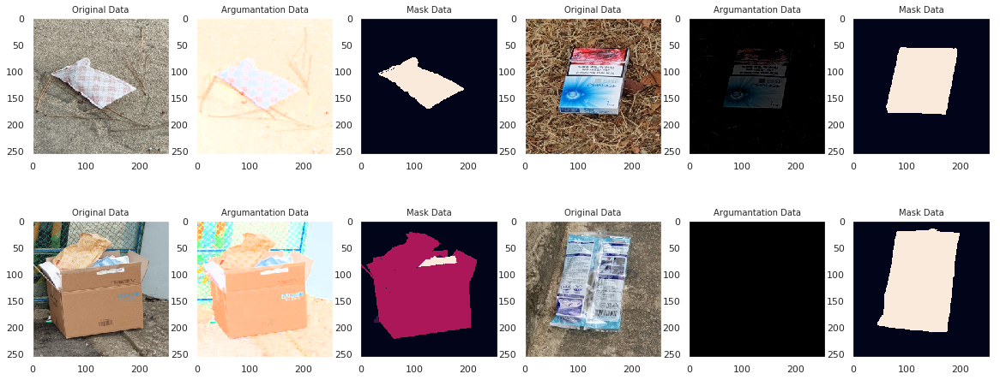

In [301]:

size = 256

def HueSatur():
  return A.Compose([
    A.Resize(size, size),
    A.HueSaturationValue(hue_shift_limit=3, sat_shift_limit=0, val_shift_limit=3, always_apply=True, p=1),
    ToTensorV2()
    ])


show_arg_img(HueSatur(),25)


loading annotations into memory...
Done (t=5.04s)
creating index...
index created!
loading annotations into memory...
Done (t=5.33s)
creating index...
index created!


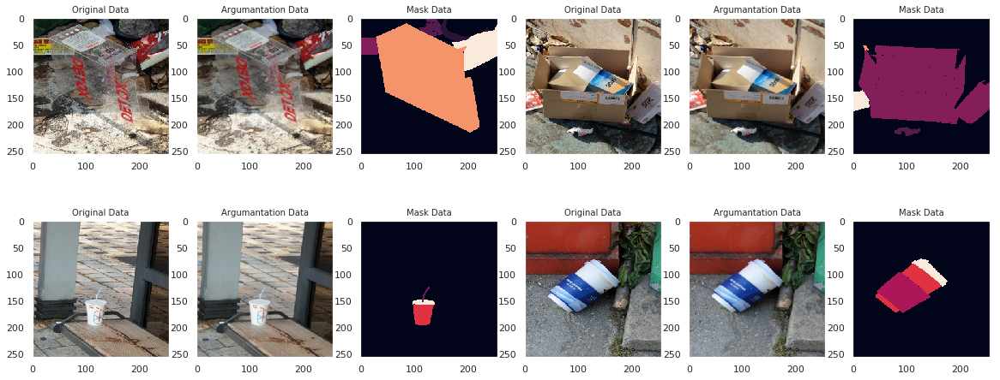

In [306]:
size = 256

def OpticalDistortion():
  return A.Compose([
    A.Resize(size, size),
    A.OpticalDistortion(always_apply=True, p=1),
    ToTensorV2()
    ])

show_arg_img(OpticalDistortion(),23)


loading annotations into memory...
Done (t=5.07s)
creating index...
index created!
loading annotations into memory...
Done (t=5.38s)
creating index...
index created!


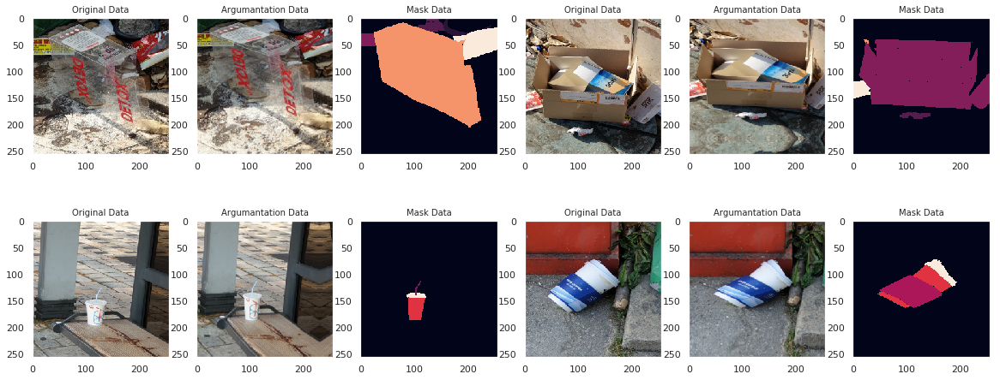

In [308]:
size = 256

def GridDistortion():
  return A.Compose([
    A.Resize(size, size),
    A.GridDistortion(always_apply=True, p=1),
    ToTensorV2()
    ])

show_arg_img(GridDistortion(),23)

loading annotations into memory...
Done (t=5.05s)
creating index...
index created!
loading annotations into memory...
Done (t=5.35s)
creating index...
index created!


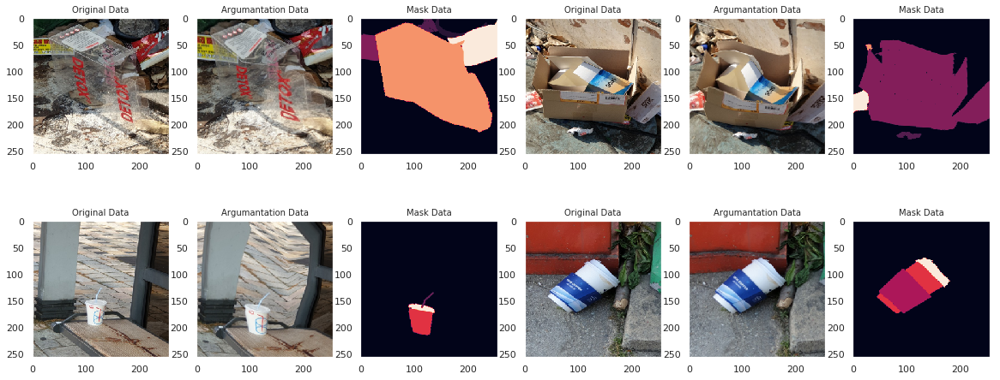

In [309]:
size = 256

def IAAPiecewiseAffine():
  return A.Compose([
    A.Resize(size, size),
    A.IAAPiecewiseAffine(always_apply=True, p=1),
    ToTensorV2()
    ])

show_arg_img(IAAPiecewiseAffine(),23)

loading annotations into memory...
Done (t=7.44s)
creating index...
index created!
loading annotations into memory...
Done (t=7.52s)
creating index...
index created!


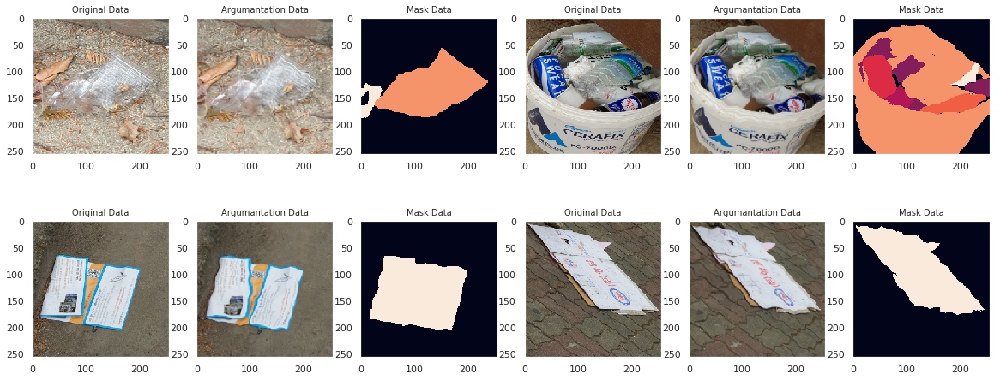

In [321]:
size = 256

def ElasticTransform():
  return A.Compose([
    A.Resize(size, size),
    A.ElasticTransform(p=1, alpha=60, sigma=120 * 0.05, alpha_affine=70 * 0.03,always_apply=True),
    ToTensorV2()
    ])

show_arg_img(ElasticTransform(),28)

## CropNonEmptyMaskIfExists
토론 게시판의 내용중 마스크가 비어 있으면 자른다? 그러면 정확하지 않을까 생각으로 적용하려고 함

loading annotations into memory...
Done (t=5.15s)
creating index...
index created!
loading annotations into memory...
Done (t=5.36s)
creating index...
index created!


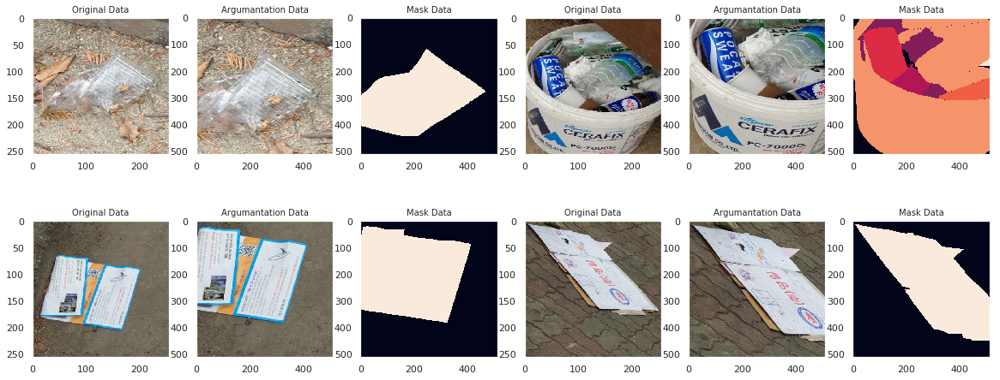

In [351]:
def CropNonEmptyMaskIfExist():
  return A.Compose([
    A.CropNonEmptyMaskIfExists(height=400, width=400, always_apply=True,p=1),
    A.Resize(512, 512),   
    ToTensorV2()
    ])

show_arg_img(CropNonEmptyMaskIfExist(),28)

loading annotations into memory...
Done (t=5.27s)
creating index...
index created!
loading annotations into memory...
Done (t=5.59s)
creating index...
index created!


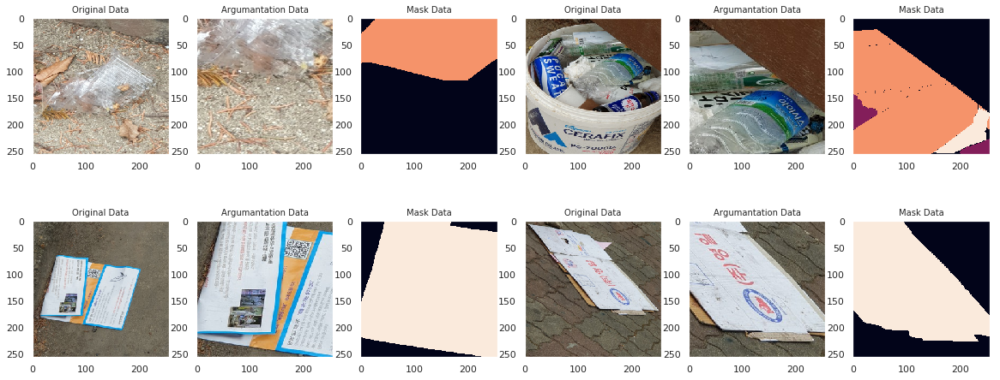

In [352]:
def CropNonEmptyMaskIfExist():
  return A.Compose([
    A.CropNonEmptyMaskIfExists(height=256, width=256, always_apply=True,p=1),
    ToTensorV2()
    ])

show_arg_img(CropNonEmptyMaskIfExist(),28)

## RandomResizedCrop
CropNonEmptyMaskIfExists 와 RandomResizedCrop 어느 것을 적용할 것인가?

loading annotations into memory...
Done (t=5.44s)
creating index...
index created!
loading annotations into memory...
Done (t=5.49s)
creating index...
index created!


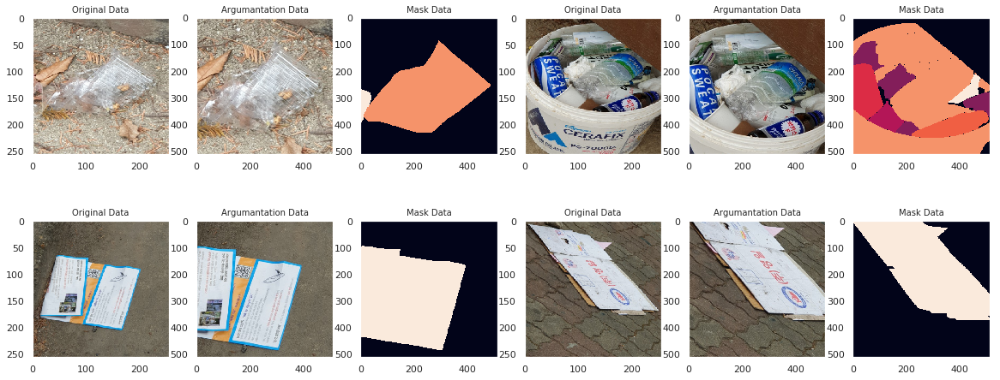

In [343]:
size = 256

def RandomResizedCrop():
  return A.Compose([
    A.RandomResizedCrop(512,512,scale = (0.5,0.8), always_apply=True,p=1),
    ToTensorV2()
    ])

show_arg_img(RandomResizedCrop(),28)

loading annotations into memory...
Done (t=5.22s)
creating index...
index created!
loading annotations into memory...
Done (t=5.44s)
creating index...
index created!


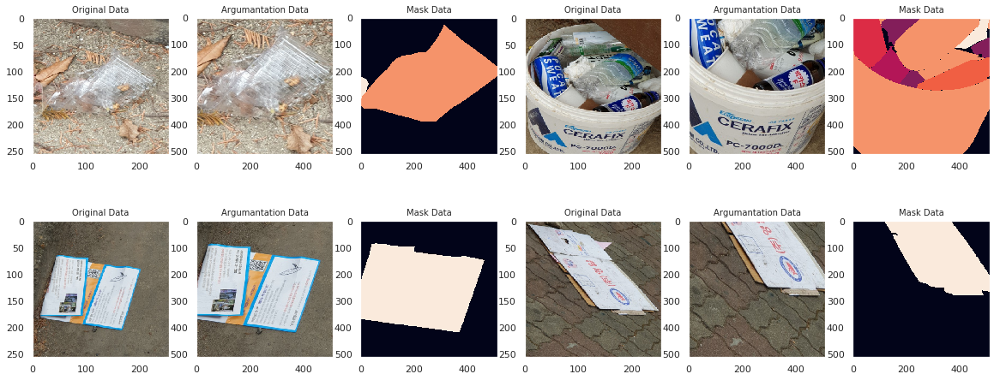

In [345]:
size = 256

def RandomResizedCrop():
  return A.Compose([
    A.RandomResizedCrop(512,512,scale=(0.5, 1.0), always_apply=True,p=1),
    ToTensorV2()
    ])

show_arg_img(RandomResizedCrop(),28)

loading annotations into memory...
Done (t=3.86s)
creating index...
index created!
loading annotations into memory...
Done (t=6.26s)
creating index...
index created!


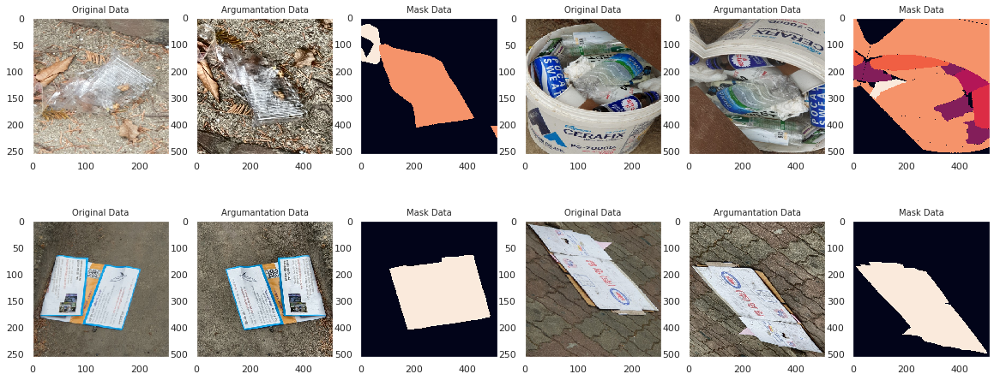

In [377]:
size = 256
from pycocotools.coco import COCO

class CustomDataLoaders(Dataset):
    """COCO format"""
    def __init__(self, data_dir,  mode = 'train', transform = None):
        super().__init__()
        self.mode = mode
        self.transform = transform
        self.coco = COCO(data_dir)
        self.category_names = get_category()
    

    def get_classname(self, classID, cats):
        for i in range(len(cats)):
            if cats[i]['id']==classID:
                return cats[i]['name']
        return "None"


        
    def __getitem__(self, index: int):
        # dataset이 index되어 list처럼 동작
        dataset_path = '/opt/ml/input/data'
        image_id = self.coco.getImgIds(imgIds=index)
        image_infos = self.coco.loadImgs(image_id)[0]
        
        # cv2 를 활용하여 image 불러오기
        images = cv2.imread(os.path.join(dataset_path, image_infos['file_name']))
        images = cv2.cvtColor(images, cv2.COLOR_BGR2RGB)
#        images /= 255
        
        if (self.mode in ('train', 'val')):
            ann_ids = self.coco.getAnnIds(imgIds=image_infos['id'])
            anns = self.coco.loadAnns(ann_ids)

            # Load the categories in a variable
            cat_ids = self.coco.getCatIds()
            cats = self.coco.loadCats(cat_ids)

            # masks : size가 (height x width)인 2D
            # 각각의 pixel 값에는 "category id + 1" 할당
            # Background = 0
            masks = np.zeros((image_infos["height"], image_infos["width"]))
            # Unknown = 1, General trash = 2, ... , Cigarette = 11
            for i in range(len(anns)):
                className = self.get_classname(anns[i]['category_id'], cats)
                pixel_value = self.category_names.index(className)
                masks = np.maximum(self.coco.annToMask(anns[i])*pixel_value, masks)
            masks = masks

            # transform -> albumentations 라이브러리 활용
            if self.transform is not None:
                transformed = self.transform(image=images, mask=masks)
                images = transformed["image"]
                masks = transformed["mask"]
            
            return images, masks, image_infos
        
        if self.mode == 'test':
            # transform -> albumentations 라이브러리 활용
            if self.transform is not None:
                transformed = self.transform(image=images)
                images = transformed["image"]
            
            return images, image_infos
    
def show_arg_img(train_transform, seed=1):
    train_path = dataset_path + '/train.json'
    val_path = dataset_path + '/val.json'
    test_path = dataset_path + '/test.json'
    origin_transform = A.Compose([
                            A.Resize(256,256),
                            ToTensorV2()
                            ])

    train_dataset = CustomDataLoaders(data_dir=train_path, mode='val', transform=train_transform)
    origin_dataset = CustomDataLoaders(data_dir=train_path, mode='val', transform=origin_transform)

    fig, axes = plt.subplots(nrows=2, ncols=6, figsize=(20, 8))
    row, col = 0,0

    for i in range(4):
        idx = i +10 * seed 
        temp_images, temp_masks, image_infos = train_dataset[idx]
        origin_images, _ , _ = origin_dataset[idx]

        row = i//2

        if i%2 ==0:
            cols=0
        else:
            cols =3
        imgs = [origin_images.permute([1,2,0]),temp_images.permute([1,2,0]),temp_masks ]
        title = ["Original Data","Argumantation Data", "Mask Data"]
        cnt =0
        for col in range(cols,cols+3):
            axes[row][col].imshow(imgs[cnt])
            axes[row][col].grid(False)
            axes[row][col].set_title(title[cnt], fontsize = 10)
            cnt +=1

    plt.show()

    
def clahe():
  return A.Compose([
    A.CLAHE(),
    A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
    A.HorizontalFlip(p=0.5),
    A.ShiftScaleRotate(),
    A.RandomBrightnessContrast(brightness_limit=0.15, contrast_limit=0.2, p=0.5),
    A.OneOf([
      A.RandomResizedCrop(512,512,scale = (0.5,0.8),p=0.8),
      A.CropNonEmptyMaskIfExists(height=300, width=300, p=0.2),
    ], p=0.5),
    A.Resize(512, 512),
    A.VerticalFlip(p=0.5),
    ToTensorV2()
    ])

show_arg_img(clahe(),28)